# Library

In [1]:
import numpy as np
import torch
import matplotlib.pyplot as plt
from matplotlib import colors

# Datasets

In [2]:
input_dim = 1
output_dim = 1
A = 3*np.random.rand(output_dim, input_dim) - 1
b = 3*np.random.rand(input_dim)
print("A : ", A)
print("B : ", b)
true_model = lambda x: A @ x + b # A @ x: Here, A is likely a matrix, and x is a vector. The @ operator is used for matrix-vector multiplication in Python when using libraries like NumPy or PyTorch.

A :  [[0.70790081]]
B :  [1.77894151]


In [3]:
true_model

<function __main__.<lambda>(x)>

In [4]:
n_train = 1000
noise_level = 0.04

# n_train samples
x_train = np.random.rand(n_train, input_dim)
y_train = np.array([true_model(x) for x in x_train]) # list comprehension
print(y_train[0])

[2.20145896]


In [5]:
# Add Noise
y_train += noise_level * np.random.standard_normal(size=y_train.shape)
print(y_train[0])

[2.22738762]


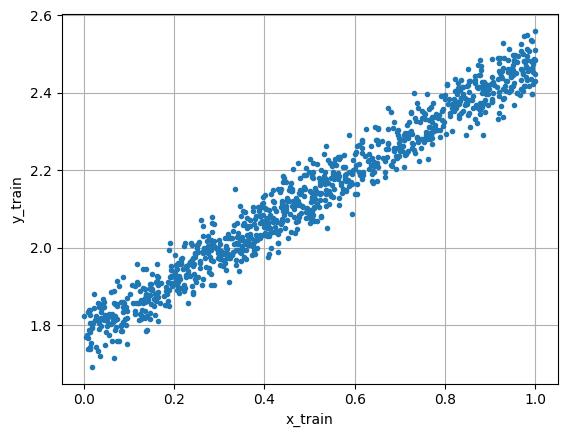

In [6]:
if input_dim == output_dim == 1:
    fig = plt.figure()
    fig.clf()
    ax = fig.gca()
    ax.plot(x_train, y_train, '.')
    ax.grid(True)
    ax.set_xlabel('x_train')
    ax.set_ylabel('y_train')

In [7]:
class VectorialDataset(torch.nn.Module):
  def __init__(self, input_data, output_data):
    super(VectorialDataset, self).__init__()
    self.input_data = torch.tensor(input_data.astype('f'))
    self.output_data = torch.tensor(output_data.astype('f'))

  def __len__(self):
    return self.input_data.shape[0]

  def __getitem__(self, idx):
    if torch.is_tensor(idx):
      idx = idx.tolist()
    sample = (self.input_data[idx, :], self.output_data[idx, :])
    return sample

In [8]:
training_set = VectorialDataset(input_data = x_train, output_data = y_train)

In [9]:
len(training_set)

1000

In [10]:
training_set[0:5]

(tensor([[0.5969],
         [0.9470],
         [0.8069],
         [0.0373],
         [0.5701]]),
 tensor([[2.2274],
         [2.4060],
         [2.3707],
         [1.8326],
         [2.1668]]))

In [11]:
# DataLoader
batch_size = 120
train_loader = torch.utils.data.DataLoader(training_set, batch_size = batch_size,
                                           shuffle = True
                                           )

In [12]:
for idx, batch in enumerate(train_loader):
  print(f'Batch n. {idx+1}, input_size = {batch[0].shape}, Output size = {batch[1].shape}')

Batch n. 1, input_size = torch.Size([120, 1]), Output size = torch.Size([120, 1])
Batch n. 2, input_size = torch.Size([120, 1]), Output size = torch.Size([120, 1])
Batch n. 3, input_size = torch.Size([120, 1]), Output size = torch.Size([120, 1])
Batch n. 4, input_size = torch.Size([120, 1]), Output size = torch.Size([120, 1])
Batch n. 5, input_size = torch.Size([120, 1]), Output size = torch.Size([120, 1])
Batch n. 6, input_size = torch.Size([120, 1]), Output size = torch.Size([120, 1])
Batch n. 7, input_size = torch.Size([120, 1]), Output size = torch.Size([120, 1])
Batch n. 8, input_size = torch.Size([120, 1]), Output size = torch.Size([120, 1])
Batch n. 9, input_size = torch.Size([40, 1]), Output size = torch.Size([40, 1])


In [13]:
first_batch = []
for epoch in range(2):
  for idx, batch in enumerate(train_loader):
    if idx == 0:
      first_batch.append(batch)


In [14]:
np.c_[x_train[:batch_size], first_batch[0][0].numpy(), first_batch[1][0].numpy()]

array([[0.59685968, 0.26354587, 0.49128136],
       [0.94697859, 0.35434213, 0.35505831],
       [0.80690193, 0.29787621, 0.52141649],
       [0.0373061 , 0.14897247, 0.28402585],
       [0.57014733, 0.39035618, 0.55294275],
       [0.75587513, 0.3077575 , 0.16168909],
       [0.76195087, 0.05100659, 0.90490437],
       [0.53188471, 0.2844207 , 0.65070468],
       [0.02541714, 0.32932892, 0.8433215 ],
       [0.34528216, 0.42997253, 0.2041095 ],
       [0.98992149, 0.96719027, 0.15825847],
       [0.64220249, 0.50957215, 0.85497653],
       [0.43907829, 0.93532848, 0.86539966],
       [0.12878528, 0.55328327, 0.21072602],
       [0.7100592 , 0.79239452, 0.50175786],
       [0.8351896 , 0.4390783 , 0.77077425],
       [0.14761297, 0.42623952, 0.58504456],
       [0.17949272, 0.42631862, 0.55176848],
       [0.14897246, 0.99497044, 0.02252271],
       [0.28402586, 0.8333087 , 0.78571689],
       [0.76694604, 0.17676051, 0.83180451],
       [0.1767605 , 0.66752934, 0.8743977 ],
       [0.

In [15]:
import torch.nn as nn
import torch

class LinearModel(nn.Module):
  def __init__(self, input_dim, output_dim):
    super(LinearModel, self).__init__()
    self.input_dim = input_dim
    self.output_dim = output_dim
    self.linear = nn.Linear(self.input_dim, self.output_dim, bias = True)

  def forward(self, x):
    return self.linear(x)
  def reset(self):
    self.linear.reset_parameters()


In [16]:
model = LinearModel(input_dim, output_dim)

In [17]:
list(model.parameters())

[Parameter containing:
 tensor([[0.8741]], requires_grad=True),
 Parameter containing:
 tensor([-0.3317], requires_grad=True)]

In [18]:
model.linear.weight

Parameter containing:
tensor([[0.8741]], requires_grad=True)

In [19]:
model.linear.bias

Parameter containing:
tensor([-0.3317], requires_grad=True)

In [20]:
x = torch.randn(5, input_dim)
print("Data: ", x)
print("---------------")
model.forward(x)

Data:  tensor([[ 1.0969],
        [-0.4817],
        [ 1.1189],
        [-0.9363],
        [ 0.2333]])
---------------


tensor([[ 0.6271],
        [-0.7528],
        [ 0.6463],
        [-1.1501],
        [-0.1278]], grad_fn=<AddmmBackward0>)

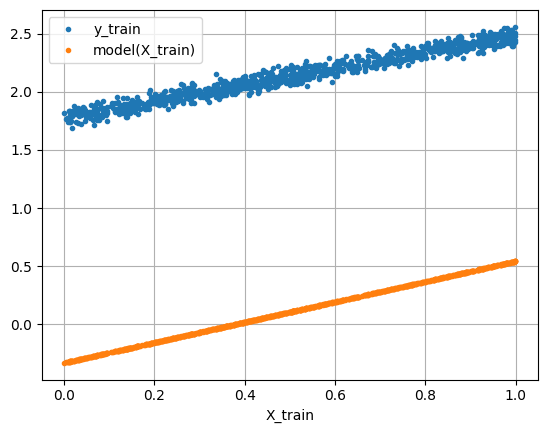

In [21]:
if input_dim == output_dim == 1:
    fig = plt.figure()
    fig.clf()
    ax = fig.gca()
    ax.plot(training_set.input_data, training_set.output_data, '.')
    ax.plot(training_set.input_data, model.forward(training_set.input_data).detach().numpy(), '.')
    ax.grid(True)
    ax.set_xlabel('X_train')
    ax.legend(['y_train', 'model(X_train)'])

In [22]:
# Losses
loss_fun = nn.MSELoss('mean')

/usr/local/lib/python3.10/dist-packages/torch/nn/_reduction.py:42: UserWarning: size_average and reduce args will be deprecated, please use reduction='mean' instead.
  warnings.warn(warning.format(ret))


In [23]:
x = torch.tensor(np.array([1, 2, 1]).astype('f'))
z = torch.tensor(np.array([2, 3, 2]).astype('f'))
print(loss_fun(x, z))

tensor(1.)


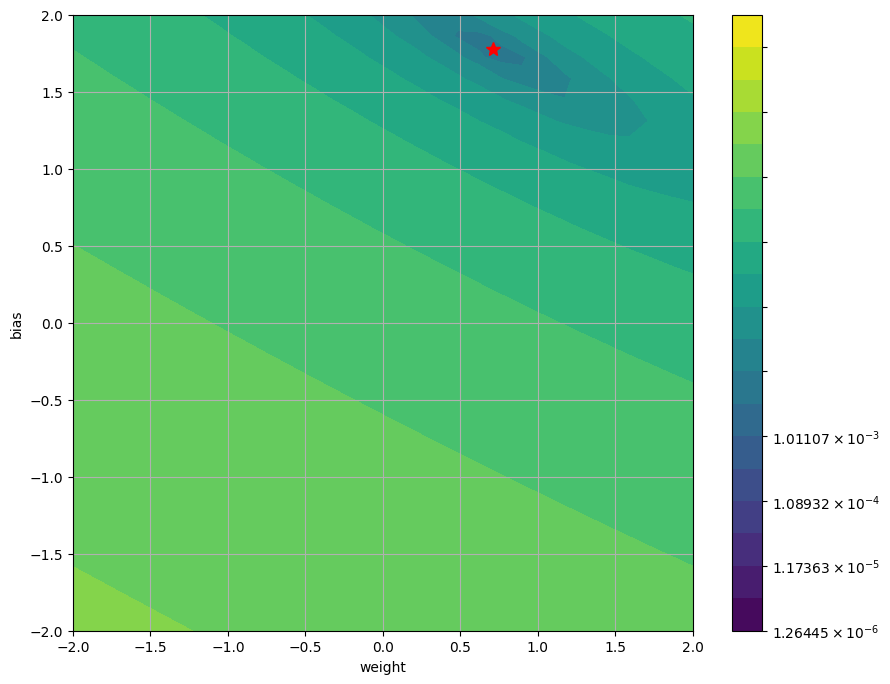

In [24]:
if input_dim == output_dim == 1:

    state_dict = model.state_dict()

    ww, bb = np.meshgrid(np.linspace(-2, 2, 30), np.linspace(-2, 2, 30))

    loss_values = 0 * ww
    for i in range(ww.shape[0]):
        for j in range(ww.shape[1]):
            state_dict['linear.weight'] = torch.tensor([[ww[i, j]]])
            state_dict['linear.bias'] = torch.tensor([bb[i, j]])
            model.load_state_dict(state_dict)
            loss_values[i, j] = loss_fun(model.forward(training_set.input_data),  training_set.output_data)

    fig = plt.figure(figsize=(10, 8))
    fig.clf()
    ax = fig.gca()
    levels = np.logspace(np.log(np.min(loss_values)), np.log(np.max(loss_values)), 20)
    c=ax.contourf(ww, bb, loss_values, levels=levels, norm=colors.LogNorm())
    plt.colorbar(c)
    ax.plot(A[0], b, 'r*', markersize=10)
    ax.set_ylabel('bias')
    ax.set_xlabel('weight')
    #ax.legend(['(A, b)'])

    ax.grid(True)

In [25]:
x = torch.randn(1, input_dim)
y = torch.randn(1, output_dim)
model.zero_grad()
loss = loss_fun(model.forward(x), y)
loss.backward()

In [26]:
loss

tensor(0.1614, grad_fn=<MseLossBackward0>)

In [27]:
lr = 0.1
weight_decay = 5e-4
optimizer = torch.optim.Adam(model.parameters(), lr=lr, weight_decay=weight_decay)

In [28]:
n_epochs = 120
train_hist = {}
train_hist['loss'] = []
if input_dim == output_dim == 1:
  train_hist['weight'] = []
  train_hist['bias'] = []
for epoch in range(n_epochs):
  for idx, batch in enumerate(train_loader):
    optimizer.zero_grad()
    loss = loss_fun(model.forward(batch[0]),  batch[1])
    loss.backward()
    optimizer.step()

    train_hist['loss'].append(loss.item())
    if input_dim == output_dim == 1:
      train_hist['weight'].append(model.linear.weight.item())
      train_hist['bias'].append(model.linear.bias.item())

    print('[Epoch %4d/%4d] [Batch %4d/%d] Loss: % 2.2e' % (epoch + 1, n_epochs,
                                                                idx + 1, len(train_loader), loss.item()))
model.eval()

[Epoch    1/ 120] [Batch    1/9] Loss:  8.93e-01
[Epoch    1/ 120] [Batch    2/9] Loss:  5.37e-01
[Epoch    1/ 120] [Batch    3/9] Loss:  4.16e-01
[Epoch    1/ 120] [Batch    4/9] Loss:  2.79e-01
[Epoch    1/ 120] [Batch    5/9] Loss:  1.54e-01
[Epoch    1/ 120] [Batch    6/9] Loss:  6.91e-02
[Epoch    1/ 120] [Batch    7/9] Loss:  4.66e-02
[Epoch    1/ 120] [Batch    8/9] Loss:  4.40e-02
[Epoch    1/ 120] [Batch    9/9] Loss:  4.36e-02
[Epoch    2/ 120] [Batch    1/9] Loss:  9.32e-02
[Epoch    2/ 120] [Batch    2/9] Loss:  1.23e-01
[Epoch    2/ 120] [Batch    3/9] Loss:  1.41e-01
[Epoch    2/ 120] [Batch    4/9] Loss:  1.65e-01
[Epoch    2/ 120] [Batch    5/9] Loss:  1.69e-01
[Epoch    2/ 120] [Batch    6/9] Loss:  1.34e-01
[Epoch    2/ 120] [Batch    7/9] Loss:  1.29e-01
[Epoch    2/ 120] [Batch    8/9] Loss:  8.89e-02
[Epoch    2/ 120] [Batch    9/9] Loss:  8.09e-02
[Epoch    3/ 120] [Batch    1/9] Loss:  5.79e-02
[Epoch    3/ 120] [Batch    2/9] Loss:  3.68e-02
[Epoch    3/ 120] [B

LinearModel(
  (linear): Linear(in_features=1, out_features=1, bias=True)
)

In [29]:
if input_dim == output_dim == 1:
    n_test = 500
    X_test = np.random.rand(n_test, input_dim)
    y_pred = []

    state_dict = model.state_dict()

    for idx in range(len(train_hist['weight'])):
        state_dict['linear.weight'] = torch.tensor([[train_hist['weight'][idx]]])
        state_dict['linear.bias'] = torch.tensor([train_hist['bias'][idx]])
        model.load_state_dict(state_dict)

        y_pred.append(model.forward(torch.tensor(X_test.astype('f'))).detach().numpy())

In [30]:
y_pred

[array([[3.709974 ],
        [3.4206052],
        [2.7029424],
        [2.4883375],
        [2.9349856],
        [2.593625 ],
        [3.4236429],
        [2.6660275],
        [3.772832 ],
        [2.3570223],
        [2.4056666],
        [2.372268 ],
        [3.3786752],
        [2.0076232],
        [3.2230177],
        [3.7260075],
        [2.0749717],
        [3.100842 ],
        [1.9154824],
        [2.320107 ],
        [1.9838914],
        [2.155246 ],
        [1.9557674],
        [3.6877675],
        [2.2726862],
        [2.4857583],
        [3.022943 ],
        [2.1525507],
        [2.9848728],
        [2.5602145],
        [3.3438244],
        [2.4396982],
        [3.046662 ],
        [3.6506872],
        [3.0360284],
        [2.4088106],
        [3.5192425],
        [2.5725899],
        [3.4154534],
        [3.6561093],
        [2.1773596],
        [2.4440236],
        [2.7951884],
        [2.6131322],
        [3.1736002],
        [2.3814962],
        [2.8483088],
        [3.07

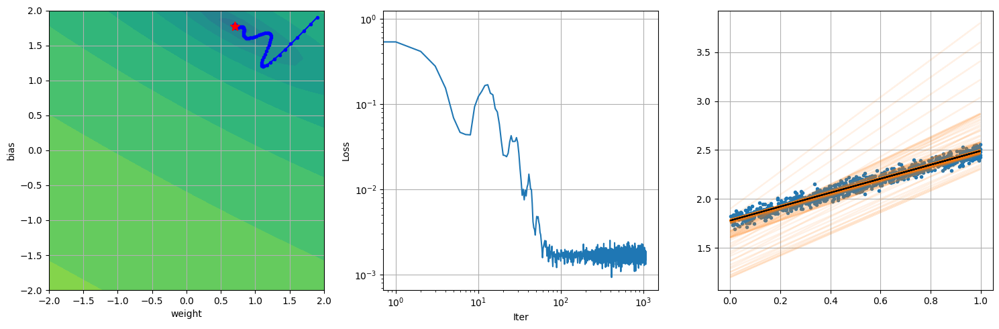

In [31]:
if input_dim == output_dim == 1:
    fig = plt.figure(figsize=(15, 5))
    fig.clf()

    ax = fig.add_subplot(1, 3, 1)
    levels = np.logspace(np.log(np.min(loss_values)), np.log(np.max(loss_values)), 20)
    ax.contourf(ww, bb, loss_values, levels=levels, norm=colors.LogNorm())
    ax.plot(train_hist['weight'], train_hist['bias'], '.-b')
    ax.plot(A[0], b, 'r*', markersize=10)
    ax.set_xlabel('weight')
    ax.set_ylabel('bias')
    #ax.legend(['optim', '(A, b)'])
    ax.grid(True)
    ax.set_xlim(-2, 2)
    ax.set_ylim(-2, 2)

    ax = fig.add_subplot(1, 3, 2)
    ax.loglog(np.abs(train_hist['loss']))
    ax.set_xlabel('Iter')
    ax.set_ylabel('Loss')
    ax.grid(True)

    ax = fig.add_subplot(1, 3, 3)
    ax.plot(x_train, y_train, '.')
    a=ax.plot(X_test, y_pred[0], '-', alpha=0.1)
    for y in y_pred[1:]:
        ax.plot(X_test, y, '-', alpha=0.1, color=a[0].get_color())
    ax.plot(X_test, y_pred[-1], 'k')
    ax.grid(True)

    fig.tight_layout()

else:
    fig = plt.figure()
    fig.clf()
    ax = fig.gca()
    ax.loglog(np.abs(train_hist['loss']))
    ax.set_xlabel('Iter')
    ax.set_ylabel('Loss')
    ax.grid(True)